In [1]:
#!/usr/bin/python
#import wradlib as wrl
import pylab as pl
from glob import glob
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np

import csv
import os
import datetime
import pandas as pd

#shapefile: GIS vector data format (ESRI)
import shapefile as shp  # Requires the pyshp package
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import ticker
import netCDF4 as nc4
from datetime import date,timedelta
import plotly.graph_objs as go
import matplotlib.lines as mlines
import seaborn as sns

import importlib
import geopandas as gpd

#import external functions (need pip install ipynb)
import ipynb.fs.full.HaileventsFunctions as HF

In [2]:
#Folder address containing data:
fold = '/home/ciccuz/phd/KIT/hail_data/'

## Scripts to investigate nature of the datasets:

In [3]:
#Preliminar parameters:

#lat/lon coords to cover the whole SPHERA domain:
lonmin_S=6; lonmax_S=19; latmin_S=35; latmax_S=49
latplot_S=[latmin_S,latmax_S]; lonplot_S=[lonmin_S,lonmax_S]

#Read the shapefiles:
sf_it = shp.Reader(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1'); srn=5;
sf_de = shp.Reader(fold + "hail4_punge/geodata/DEU_adm/DEU_adm0.shp", encoding='latin-1'); srn=5;
sf_aut = shp.Reader(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1'); srn=5;
sf_che = shp.Reader(fold + "hail4_punge/geodata/CHE_adm/CHE_adm0.shp", encoding='latin-1'); srn=5;
sf_cro = shp.Reader(fold + "hail4_punge/geodata/Croatia/mj788hg8036.shp", encoding='latin-1'); srn=5;
sf_slo = shp.Reader(fold + "hail4_punge/geodata/Slovenia/gk259nt7452.shp", encoding='latin-1'); srn=5;
sf_hun = shp.Reader(fold + "hail4_punge/geodata/Hungary/qh513vs8921.shp", encoding='latin-1'); srn=5;

#With geopandas:
sfg_ita = gpd.read_file(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1')
sfg_deu = gpd.read_file(fold + "hail4_punge/geodata/DEU_adm/DEU_adm0.shp", encoding='latin-1')
sfg_aut = gpd.read_file(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1')
sfg_che = gpd.read_file(fold + "hail4_punge/geodata/CHE_adm/CHE_adm0.shp", encoding='latin-1')
sfg_cro = gpd.read_file(fold + "hail4_punge/geodata/Croatia/mj788hg8036.shp", encoding='latin-1')
sfg_slo = gpd.read_file(fold + "hail4_punge/geodata/Slovenia/gk259nt7452.shp", encoding='latin-1')
sfg_hun = gpd.read_file(fold + "hail4_punge/geodata/Hungary/qh513vs8921.shp", encoding='latin-1')

#maps limits whole SPHERA domain
x_lim_S=lonplot_S
y_lim_S=latplot_S

x_lim = x_lim_S
y_lim = y_lim_S

clonsel, clatsel, csizesel, cnamesel, ckindsel = HF.HF_cities(latmin_S,latmax_S,lonmin_S,lonmax_S)

sf_geo = [sfg_ita,sfg_aut]

#### - ESWD
How many events are present in the period 2016-2018 over the whole SPHERA domain? **1450**

How many during the extended summer season (apr-oct)? **1395**

How many of them have information on size of hail? **1058**

How many eswd events happened in Italy (2016-2018, Apr-Oct)? **434**

In [4]:
df_eswd = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_19790101-20200531_v1_6.csv')   #Swabian Jura 2013

In [5]:
eswd_df = pd.DataFrame(columns=['datetime','lat','lon','size','QC_level'])
eswd_df['datetime'] = pd.to_datetime(df_eswd['TIME_EVENT'])
eswd_df['lat'] = df_eswd['LATITUDE']
eswd_df['lon'] = df_eswd['LONGITUDE']
eswd_df['size'] = df_eswd['MAX_HAIL_DIAMETER']
eswd_df['QC_level'] = df_eswd['QC_LEVEL']

eswd_df = eswd_df.sort_values(by='datetime').reset_index(drop=True)

#try:retain only data in the selected day and year and within hhmin and hhmax, as well as within latmin,latmax and lonmin,lonmax
eswd_df_years = eswd_df.datetime.apply(lambda x: x.year)
eswd_df_months = eswd_df.datetime.apply(lambda x: x.month)
eswd_df_days = eswd_df.datetime.apply(lambda x: x.day)
eswd_df_hours = eswd_df.datetime.apply(lambda x: x.hour)

eswd_df_sel = eswd_df.loc[(eswd_df_years >= 2016) & (eswd_df_years <= 2018) & (eswd_df_months >= 4)
                         & (eswd_df_months <= 10)]
eswd_df_sel = eswd_df_sel.loc[(eswd_df_sel.lat >= latmin_S) & (eswd_df_sel.lat <= latmax_S)]
eswd_ev_sel = eswd_df_sel.loc[(eswd_df_sel.lon >= lonmin_S) & (eswd_df_sel.lon <= lonmax_S)].reset_index(drop=True)


In [6]:
eswd_ev_sel.loc[eswd_ev_sel['size'].isnull() != True].reset_index()

,index,datetime,lat,lon,size,QC_level
0,2,2016-04-07 19:20:00,46.167,8.800,2.0,QC1
1,3,2016-04-08 04:05:00,48.350,17.567,2.0,QC0+
2,5,2016-04-12 12:55:00,48.822,9.307,2.0,QC0+
3,7,2016-04-12 13:56:00,48.867,10.017,2.0,QC1
4,10,2016-04-14 10:00:00,44.226,18.691,3.0,QC1
...,...,...,...,...,...,...
1054,1381,2018-09-07 14:20:00,41.365,15.694,5.0,QC1
1055,1382,2018-09-07 14:40:00,41.330,15.711,5.0,QC1
1056,1383,2018-09-18 15:35:00,48.133,8.333,3.5,QC1
1057,1393,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+


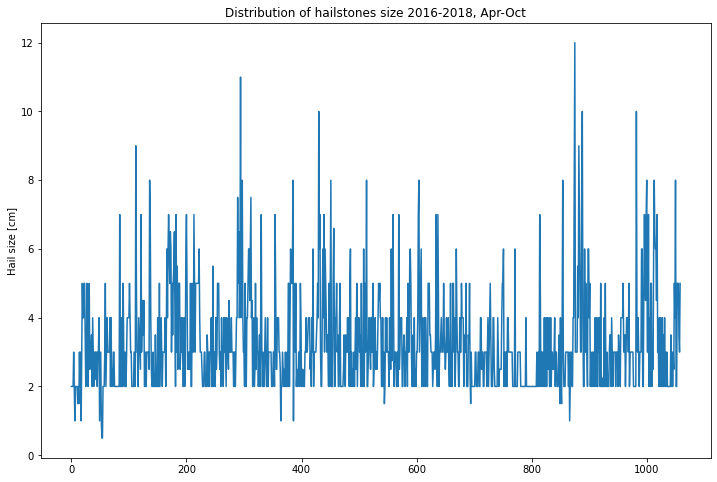

In [7]:
#Distribution of size of hail for events having info on size
fig, ax = plt.subplots(figsize = (12,8))
plt.plot(eswd_ev_sel.loc[eswd_ev_sel['size'].isnull() != True].reset_index().index, 
         eswd_ev_sel.loc[eswd_ev_sel['size'].isnull() != True]['size'])
plt.ylabel('Hail size [cm]')
plt.title('Distribution of hailstones size 2016-2018, Apr-Oct');

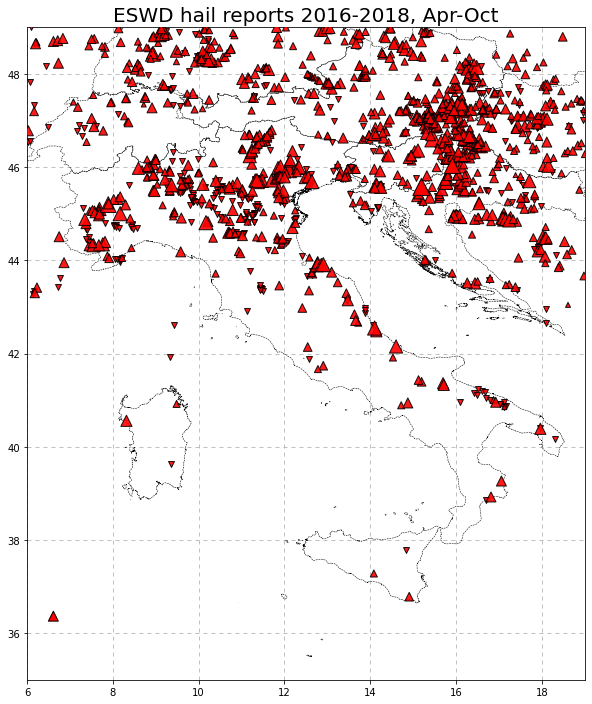

In [8]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

'''
PLOT shapefile
'''
HF.HF_plotshape(sf_it);
HF.HF_plotshape(sf_aut);
HF.HF_plotshape(sf_de);
HF.HF_plotshape(sf_che);
HF.HF_plotshape(sf_cro);
HF.HF_plotshape(sf_slo);
HF.HF_plotshape(sf_hun);

'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
eswd_ev_sel_NOsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == True].reset_index(drop=True)
eswd_ev_sel_wsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(eswd_ev_sel_NOsize.lon,eswd_ev_sel_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(eswd_ev_sel_wsize.lon,eswd_ev_sel_wsize.lat,25*eswd_ev_sel_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct', fontsize=20);

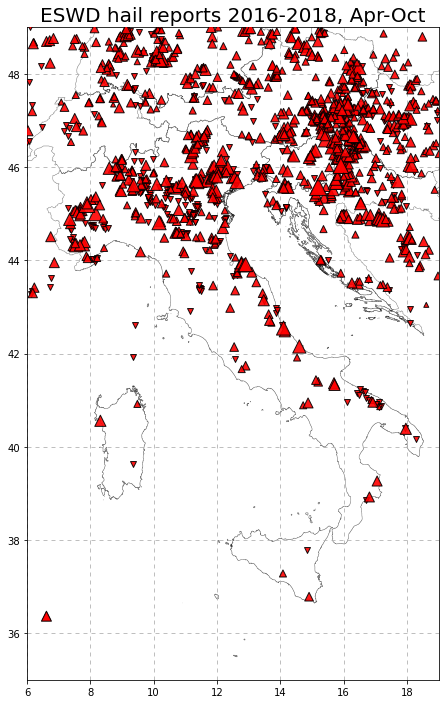

In [9]:
fig, ax = plt.subplots(figsize = (15,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

'''
PLOT shapefile
'''
sfg_ita.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_deu.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_aut.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_che.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_cro.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_slo.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_hun.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)

'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
eswd_ev_sel_NOsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == True].reset_index(drop=True)
eswd_ev_sel_wsize = eswd_ev_sel.loc[np.isnan(eswd_ev_sel['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(eswd_ev_sel_NOsize.lon,eswd_ev_sel_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(eswd_ev_sel_wsize.lon,eswd_ev_sel_wsize.lat,25*eswd_ev_sel_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct', fontsize=20);


Try masking ESWD data considering shapefile only over Italy -> 

https://towardsdatascience.com/masking-geo-spatial-level-3-satellite-images-using-shapefiles-a-grid-based-approach-c88d7a108f4a

https://www.guillaumedueymes.com/post/shapefiles_country/

In [10]:
#load shapefile with geopandas
ita = gpd.read_file(fold + "hail4_punge/geodata/ITA_adm/ITA_adm0.shp", encoding='latin-1')
aut = gpd.read_file(fold + "hail4_punge/geodata/AUT_adm/AUT_adm0.shp", encoding='latin-1')
ita.head()

,ID_0,ISO,NAME_ENGLI,NAME_ISO,NAME_FAO,NAME_LOCAL,NAME_OBSOL,NAME_VARIA,NAME_NONLA,NAME_FRENC,...,CONTAINS,SOVEREIGN,ISO2,WWW,FIPS,ISON,VALIDFR,VALIDTO,EUmember,geometry
0,112,ITA,Italy,ITALY,Italy,Italia,None,None,None,Italie,...,Trieste,Italy,IT,None,IT,380.0,1946,Present,1.0,"MULTIPOLYGON (((12.53764 35.52986, 12.53764 35..."


- Now to mask **points** and non-gridded data (like eswd) we must create a new column "geometry" in its pandas DataFrame made of shapely points objects given by the lat/lon couples: https://gis.stackexchange.com/questions/404196/create-a-column-geometry-of-points-with-longitude-and-latitude-data-given-in-a

In [11]:
eswd_ev_sel = gpd.GeoDataFrame(eswd_ev_sel, geometry=gpd.points_from_xy(eswd_ev_sel.lon, eswd_ev_sel.lat)) 
eswd_ev_sel

,datetime,lat,lon,size,QC_level,geometry
0,2016-04-06 15:55:00,46.993,13.150,NaN,QC0+,POINT (13.15000 46.99300)
1,2016-04-07 06:30:00,45.815,9.571,NaN,QC1,POINT (9.57100 45.81500)
2,2016-04-07 19:20:00,46.167,8.800,2.0,QC1,POINT (8.80000 46.16700)
3,2016-04-08 04:05:00,48.350,17.567,2.0,QC0+,POINT (17.56700 48.35000)
4,2016-04-08 14:30:00,45.117,7.308,NaN,QC1,POINT (7.30800 45.11700)
...,...,...,...,...,...,...
1391,2018-10-01 15:30:00,43.433,6.733,NaN,QC0+,POINT (6.73300 43.43300)
1392,2018-10-07 12:00:00,40.158,18.292,NaN,QC0+,POINT (18.29200 40.15800)
1393,2018-10-21 16:00:00,42.142,12.541,3.0,QC0+,POINT (12.54100 42.14200)
1394,2018-10-21 18:00:00,41.888,12.565,NaN,QC0+,POINT (12.56500 41.88800)


In [12]:
#use gpd.clip to retain all the POINTS falling into the ita shapefile:
ita_eswd = gpd.clip(eswd_ev_sel, ita)
aut_eswd = gpd.clip(eswd_ev_sel, aut)

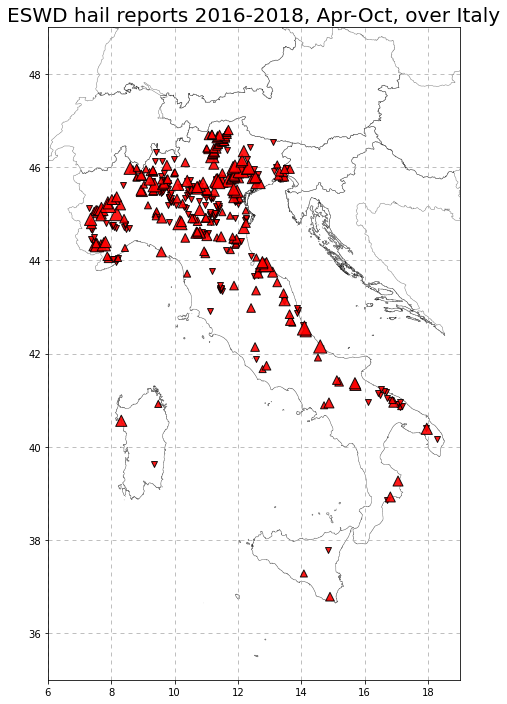

In [13]:
fig, ax = plt.subplots(figsize = (15,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

'''
PLOT shapefile
'''
sfg_ita.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_deu.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_aut.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_che.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_cro.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_slo.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_hun.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)

'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
ita_eswd_NOsize = ita_eswd.loc[np.isnan(ita_eswd['size']) == True].reset_index(drop=True)
ita_eswd_wsize = ita_eswd.loc[np.isnan(ita_eswd['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(ita_eswd_NOsize.lon,ita_eswd_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(ita_eswd_wsize.lon,ita_eswd_wsize.lat,25*ita_eswd_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct, over Italy', fontsize=20);

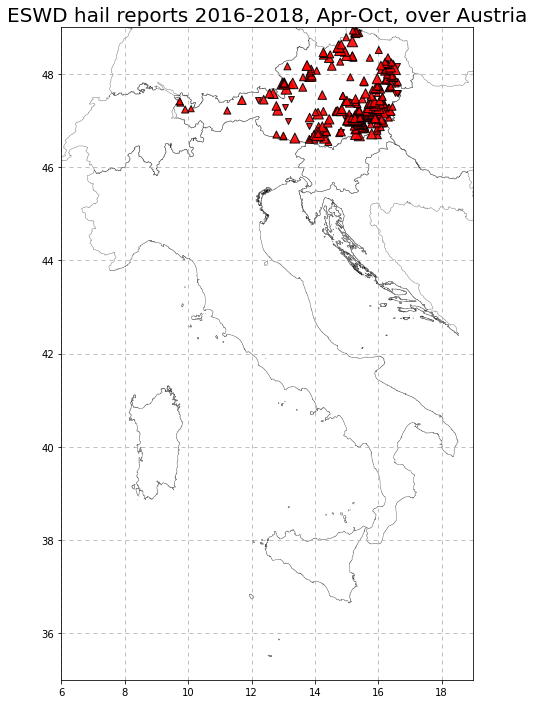

In [14]:
fig, ax = plt.subplots(figsize = (15,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

'''
PLOT shapefile
'''
sfg_ita.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_deu.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_aut.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_che.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_cro.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_slo.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)
sfg_hun.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5)

'''
PLOT ESWD data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
aut_eswd_NOsize = aut_eswd.loc[np.isnan(aut_eswd['size']) == True].reset_index(drop=True)
aut_eswd_wsize = aut_eswd.loc[np.isnan(aut_eswd['size']) == False].reset_index(drop=True)

c3_1=pl.scatter(aut_eswd_NOsize.lon,aut_eswd_NOsize.lat,35,c='red',
                marker="v",edgecolor='k',alpha=0.9,zorder=4)
c3_2=pl.scatter(aut_eswd_wsize.lon,aut_eswd_wsize.lat,25*aut_eswd_wsize['size'],
                c='red',marker="^", edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('ESWD hail reports 2016-2018, Apr-Oct, over Austria', fontsize=20);

#### - UNIPOL
How many events are present in the period **2017**-2018 over the whole SPHERA domain? **28074**

How many during the extended summer season (apr-oct)? **27219**

In [15]:
df_unipol = pd.read_csv(fold + 'data/ESWD_insurance/Insurance_ESSL_Italy_data/original_ungridded_data/UNIPOL/Estrazione_SINISTRI_GRANDINE_E_VENTO_ITALIA_DateLatLon.csv')

In [21]:
#retain only data within the day of the event
dfu_ev = pd.DataFrame()
dfu_ev = df_unipol.loc[(df_unipol.year >= 2016) & (df_unipol.year <= 2018) &
                      (df_unipol.month >= 4) & (df_unipol.month <= 10)].reset_index(drop=True)

#save date lat lon data in arrays
u_ev = pd.DataFrame(columns=['datetime','lon','lat'])
u_ev['datetime'] = pd.to_datetime({'year': dfu_ev['year'],'month':dfu_ev['month'],'day':dfu_ev['day'],'hour':dfu_ev['hour'],
               'minute':dfu_ev['min']})
u_ev['lon'] = np.array(dfu_ev.lon)
u_ev['lat'] = np.array(dfu_ev.lat)

u_ev = u_ev.sort_values(by='datetime').reset_index(drop=True)

u_ev_hours = u_ev.datetime.apply(lambda x: x.hour)
#u_ev_sel = u_ev.loc[(u_ev_hours >= hhmin) & (u_ev_hours < hhmax)]
u_ev_sel = u_ev.loc[(u_ev.lat >= latmin_S) & (u_ev.lat <= latmax_S)]
u_ev_sel = u_ev_sel.loc[(u_ev_sel.lon >= lonmin_S) & (u_ev_sel.lon <= lonmax_S)].reset_index(drop=True)

In [22]:
u_ev_sel

,datetime,lon,lat
0,2017-04-15 17:00:00,7.893009,45.456619
1,2017-04-15 17:06:00,7.679822,45.074093
2,2017-04-16 10:00:00,12.029904,44.006611
3,2017-04-16 18:30:00,11.477947,44.430923
4,2017-04-17 00:01:00,11.309953,44.778538
...,...,...,...
27215,2018-10-31 00:01:00,8.742714,45.435177
27216,2018-10-31 09:00:00,9.199469,44.312763
27217,2018-10-31 10:46:00,14.508273,40.781990
27218,2018-10-31 16:00:00,8.852163,44.726948


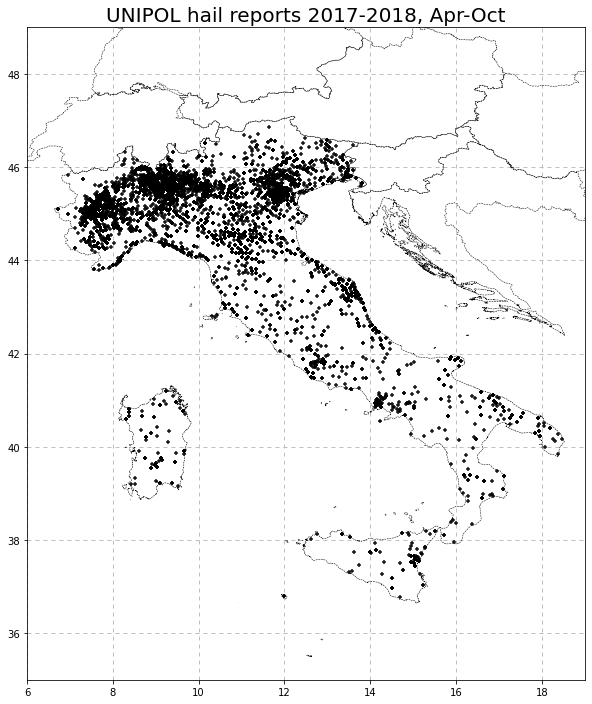

In [23]:
fig, ax = plt.subplots(figsize = (10,12))

plt.xlim(x_lim)
plt.ylim(y_lim)

'''
PLOT shapefile
'''
HF.HF_plotshape(sf_it);
HF.HF_plotshape(sf_aut);
HF.HF_plotshape(sf_de);
HF.HF_plotshape(sf_che);
HF.HF_plotshape(sf_cro);
HF.HF_plotshape(sf_slo);
HF.HF_plotshape(sf_hun);

'''
PLOT UNIPOL data 
'''

#divide eswd dataset in datasets with info on size of hail or not:
c=pl.scatter(u_ev_sel.lon,u_ev_sel.lat,15,c='black',
                marker="+",edgecolor='k',alpha=0.9,zorder=4)
pl.grid(ls=(0,(5,5)))
pl.title('UNIPOL hail reports 2017-2018, Apr-Oct', fontsize=20);

### - Problem SPHERA data plot! SOLVED and IMPLEMENTED

The leftmost column of SPHERA gridded data seems to be instead the rightmost: there seems to be a spatial shift of one grid towards left, maybe an index at the beginning of the plot is missing?? -> **SOLVED**: box_id started from 1 not from 0 shifting all the grid cells to the left of 1 place!

Also try to plot SPHERA data with shapefiles using geopandas! -> **DONE!** and much better now: much faster especially when plotting hourly data (no more kernel deaths after only 12 plots done!)

In [11]:
#read SPHERA data:
df_sp = HF.HF_reanProxies_read(2016, 8, 29, sp_res=10)

df_sp.box_id = df_sp.box_id - 1 # <---- !!!!!!

df_sp_dayMax = df_sp.groupby(['box_id'], as_index=False).max().drop(columns=['datetime'])
df_sp_Hsel = df_sp_dayMax

In [12]:
df_sp_dayMax

,box_id,%VV700,AvvGeop500,Kindex,LI,DLS,H0,CAPE_MU,CAPE_ML
0,0,95.000000,77.701225,27.561138,7.245616,12.658209,4580.33105,244.074997,52.418751
1,1,95.652176,63.493324,27.855474,8.171028,14.072075,4521.51611,129.793472,35.923912
2,2,100.000000,52.867199,27.384022,7.087467,13.538944,4564.07373,103.170456,21.661932
3,3,60.000000,4.109398,27.264294,6.482629,13.052780,4585.55615,84.818748,21.384375
4,4,80.000000,55.024635,27.942713,7.264249,11.564253,4583.48730,104.218750,34.453125
...,...,...,...,...,...,...,...,...,...
18110,18145,100.000000,0.000000,37.505341,0.188688,15.509896,3834.12500,1226.625000,970.541687
18111,18146,100.000000,0.000000,37.516785,0.187982,15.406427,3818.87500,1234.937500,992.500000
18112,18147,100.000000,0.000000,37.502026,0.263787,15.221096,3817.95825,1295.541630,1084.812500
18113,18148,100.000000,0.000000,37.333996,0.330519,15.074048,3816.58325,1425.416630,1170.583370


In [13]:
sf_sp = gpd.read_file(fold + "data/lampinet/mask/grid_10_49N.shp", encoding='latin-1')

sp_par = "CAPE_MU"
col_num = 6
cbar_ext = 'max'
un_meas = '[J/kg]'

In [14]:
gdf_sp_sel = gpd.GeoDataFrame(df_sp_Hsel[["box_id",f"{sp_par}"]], geometry=sf_sp['geometry'])
gdf_sp_sel

,box_id,CAPE_MU,geometry
0,0,244.074997,"POLYGON ((6.00000 35.00000, 6.00000 35.10000, ..."
1,1,129.793472,"POLYGON ((6.10000 35.00000, 6.10000 35.10000, ..."
2,2,103.170456,"POLYGON ((6.20000 35.00000, 6.20000 35.10000, ..."
3,3,84.818748,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ..."
4,4,104.218750,"POLYGON ((6.40000 35.00000, 6.40000 35.10000, ..."
...,...,...,...
18110,18145,1226.625000,"POLYGON ((10.00000 48.90000, 10.00000 49.00000..."
18111,18146,1234.937500,"POLYGON ((10.10000 48.90000, 10.10000 49.00000..."
18112,18147,1295.541630,"POLYGON ((10.20000 48.90000, 10.20000 49.00000..."
18113,18148,1425.416630,"POLYGON ((10.30000 48.90000, 10.30000 49.00000..."


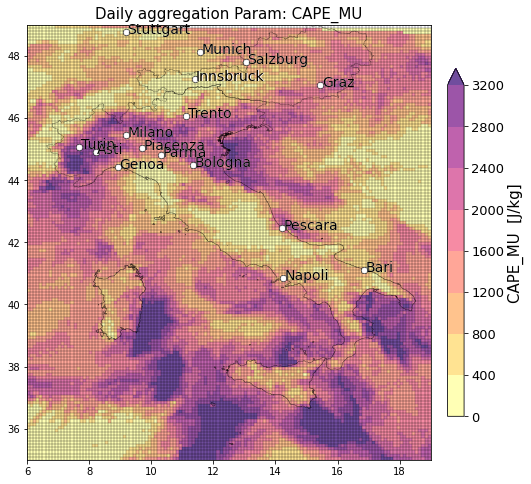

In [15]:
hourly=False

fig, ax = plt.subplots(figsize = (12,8))

if (x_lim != None) & (y_lim != None):     
    plt.xlim(x_lim)
    plt.ylim(y_lim)

#grid shapefile
sf_sp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.3, zorder=2)

#geographic shapefiles
sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #ita shapefile
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #other shapefile

#color-code grid cells for a certain parameter:
if sp_par == 'LI':
    col_num = 3
    un_meas = '[°C]'  #unit measure for colorbar label
    cbar_ext = 'max' #extension of the colorbar over defined ranges
elif sp_par == 'Kindex':
    col_num = 4
    cbar_ext = 'both'
    un_meas = '[°C]'
elif sp_par == '%VV700':
    col_num = 5
    cbar_ext = 'neither'
    un_meas = '%'
elif (sp_par == 'CAPE_MU') or (sp_par == 'CAPE_ML'):
    col_num = 6
    cbar_ext = 'max'
    un_meas = '[J/kg]'
elif sp_par == 'H0':
    col_num = 7
    cbar_ext = 'both'
    un_meas = '[m]'
elif sp_par == 'DLS':
    col_num = 8
    cbar_ext = 'both'
    un_meas = '[m/s]'

#calculate colorcoding dependent from the chosen parameter
col_boxes = df_sp_Hsel.box_id    
color_ton, bins, colors = HF.HF_calc_color(df_sp_Hsel[sp_par], color=col_num)

#plot geodataframe of SPHERA data with color_ton as colorcoding
gdf_sp_sel.plot(ax=ax, color=color_ton)

#add colorbar
cmap_sp_par = matplotlib.colors.ListedColormap(sns.color_palette(colors).as_hex())
norm = matplotlib.colors.BoundaryNorm(bins, cmap_sp_par.N, extend=cbar_ext)

img = plt.imshow([bins], cmap=cmap_sp_par, norm=norm)
img.set_visible(False)

cb_sp_par=plt.colorbar(orientation='vertical', spacing='proportional', norm=norm,  pad=0.025, shrink=0.8);
cb_sp_par.ax.set_yticklabels(bins, fontsize=13)
cb_sp_par.ax.set_ylabel(f'{sp_par}  {un_meas}', fontsize=15);


#Plot locations and labels of selected cities
for k in range(len(clonsel)):  
    pl.plot(clonsel[k],clatsel[k],'ko',markersize=6)
    pl.plot(clonsel[k],clatsel[k],'wo',markersize=5)
    pl.text(clonsel[k]+.055,clatsel[k]-.055, cnamesel[k],color='w',size=14)
    pl.text(clonsel[k]+.05,clatsel[k]-.05, cnamesel[k],size=14)

if hourly == True:
    title = str(df_sp_Hsel.datetime[0]) + " Param: " + sp_par
else:
    title = 'Daily aggregation' + " Param: " + sp_par

#pl.grid(ls=(0,(5,5)))
pl.title(label=title, fontsize=15); 

#plt.savefig('/home/ciccuz/phd/KIT/scripts/plots/AAA.png', dpi=300, bbox_inches='tight')

**TRY**: plot all CAPE values exceeding a certain threshold e.g. 2000 J/kg -> TO DO SO the color_ton must be included in advance before selecting the subset of data in the geoDf considering the whole set of CAPE otherwise colors are completely wrong!

In [16]:
gdf_sp_sel['color'] = color_ton

In [17]:
#Extract filtered data based on threshold
gdf_CAPE2000 = gdf_sp_sel.loc[gdf_sp_sel.CAPE_MU >= 1500]

In [18]:
gdf_CAPE2000

,box_id,CAPE_MU,geometry,color
41,41,1514.59375,"POLYGON ((10.10000 35.00000, 10.10000 35.10000...",#FFA698
42,42,1810.22498,"POLYGON ((10.20000 35.00000, 10.20000 35.10000...",#F68BA4
44,44,1740.48755,"POLYGON ((10.40000 35.00000, 10.40000 35.10000...",#F68BA4
45,45,1580.76880,"POLYGON ((10.50000 35.00000, 10.50000 35.10000...",#FFA698
46,46,1895.78125,"POLYGON ((10.60000 35.00000, 10.60000 35.10000...",#F68BA4
...,...,...,...,...
18030,18039,1657.87500,"POLYGON ((15.00000 48.80000, 15.00000 48.90000...",#F68BA4
18031,18040,1656.87500,"POLYGON ((15.10000 48.80000, 15.10000 48.90000...",#F68BA4
18032,18041,1628.21875,"POLYGON ((15.20000 48.80000, 15.20000 48.90000...",#F68BA4
18033,18042,1564.85413,"POLYGON ((15.30000 48.80000, 15.30000 48.90000...",#FFA698


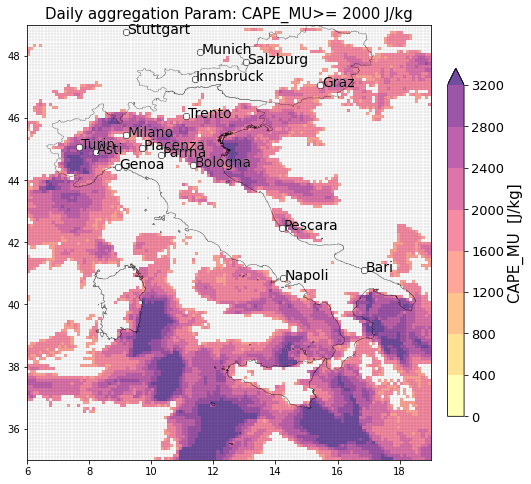

In [19]:
fig, ax = plt.subplots(figsize = (12,8))

if (x_lim != None) & (y_lim != None):     
    plt.xlim(x_lim)
    plt.ylim(y_lim)

#grid shapefile
sf_sp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.1, linestyle='--', zorder=2)

#geographic shapefiles
sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #ita shapefile
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)  #other shapefile


#plot geodataframe of SPHERA data with color_ton as colorcoding
gdf_CAPE2000.plot(ax=ax, color=gdf_CAPE2000['color'])

#add colorbar
cmap_sp_par = matplotlib.colors.ListedColormap(sns.color_palette(colors).as_hex())
norm = matplotlib.colors.BoundaryNorm(bins, cmap_sp_par.N, extend=cbar_ext)

img = plt.imshow([bins], cmap=cmap_sp_par, norm=norm)
img.set_visible(False)

cb_sp_par=plt.colorbar(orientation='vertical', spacing='proportional', norm=norm,  pad=0.025, shrink=0.8);
cb_sp_par.ax.set_yticklabels(bins, fontsize=13)
cb_sp_par.ax.set_ylabel(f'{sp_par}  {un_meas}', fontsize=15);


#Plot locations and labels of selected cities
for k in range(len(clonsel)):  
    pl.plot(clonsel[k],clatsel[k],'ko',markersize=6)
    pl.plot(clonsel[k],clatsel[k],'wo',markersize=5)
    pl.text(clonsel[k]+.055,clatsel[k]-.055, cnamesel[k],color='w',size=14)
    pl.text(clonsel[k]+.05,clatsel[k]-.05, cnamesel[k],size=14)

if hourly == True:
    title = str(df_sp_Hsel.datetime[0]) + " Param: " + sp_par
else:
    title = 'Daily aggregation' + " Param: " + sp_par + ">= 2000 J/kg"

#pl.grid(ls=(0,(5,5)))
pl.title(label=title, fontsize=15);

### - Some GEODATAFRAME tools:

In [41]:
#access area of every polygon of the geometry (in our case all equal areas as a regular gridded file is used):
gdf_sp_sel.area

0        0.01
1        0.01
2        0.01
3        0.01
4        0.01
         ... 
18110    0.01
18111    0.01
18112    0.01
18113    0.01
18114    0.01
Length: 18115, dtype: float64

In [42]:
#access the boundaries of each polygon of the geometry
gdf_sp_sel.boundary

0        LINESTRING (6.00000 35.00000, 6.00000 35.10000...
1        LINESTRING (6.10000 35.00000, 6.10000 35.10000...
2        LINESTRING (6.20000 35.00000, 6.20000 35.10000...
3        LINESTRING (6.30000 35.00000, 6.30000 35.10000...
4        LINESTRING (6.40000 35.00000, 6.40000 35.10000...
                               ...                        
18110    LINESTRING (10.00000 48.90000, 10.00000 49.000...
18111    LINESTRING (10.10000 48.90000, 10.10000 49.000...
18112    LINESTRING (10.20000 48.90000, 10.20000 49.000...
18113    LINESTRING (10.30000 48.90000, 10.30000 49.000...
18114    LINESTRING (10.40000 48.90000, 10.40000 49.000...
Length: 18115, dtype: geometry

This means that the box_id=0 refers to the low-left corner while box_id=18150 to the upper-right corner of the 10km grid considered (it actually stops at box_id=18114 because the rotation of the grid does not allow to completely fill the uppermost grid line and it stops around 10°E instead of 19°E)

In [43]:
#access the centroids of each polygon of the geometry
gdf_sp_sel.centroid

0         POINT (6.05000 35.05000)
1         POINT (6.15000 35.05000)
2         POINT (6.25000 35.05000)
3         POINT (6.35000 35.05000)
4         POINT (6.45000 35.05000)
                   ...            
18110    POINT (10.05000 48.95000)
18111    POINT (10.15000 48.95000)
18112    POINT (10.25000 48.95000)
18113    POINT (10.35000 48.95000)
18114    POINT (10.45000 48.95000)
Length: 18115, dtype: geometry

In [44]:
#measure distance of each centroid from the first centroid location:
first_point = gdf_sp_sel.centroid.iloc[0]
gdf_sp_sel.centroid.distance(first_point)

0         0.000000
1         0.100000
2         0.200000
3         0.300000
4         0.400000
           ...    
18110    14.464093
18111    14.492067
18112    14.520675
18113    14.549914
18114    14.579781
Length: 18115, dtype: float64

In [45]:
#interactively explore the geodataframe:
gdf_sp_sel.explore("CAPE_MU", legend=False)

### - TO DO: try plotting OT detections using geopandas!

in this way it should be easier to construct the filter and find matching with SPHERA data using the same way of reading georeferenced data!

Methodology employed for now (HJ):

- Read netcdf dataset using netCDF4 library storing OT probability, lons and lats and timings (check here for some docu: https://towardsdatascience.com/read-netcdf-data-with-python-901f7ff61648)

A NetCDF file has three basic parts: metadata, dimensions and variables
- Data manipulation (**understand what is done!**), with parallax correction, and produce as output 3 masked arrays for OTprob, lons and lats
- Plot OT prob. on geographic maps with colorcoding using matplotlib.pylab.pcolor

In [13]:
"""
29 August 2016 (Torino + Graz)
"""
day=2016242; year_u=2016; mon_u=8; day_u=29; lonmin=6; lonmax=17; latmin=44; latmax=49 #for Graz
#lonmin=6.5; lonmax=9; latmin=44; latmax=46     for Torino
#fold_out = 'Torino_'+"{:02d}".format(day_u)+'-'+"{:02d}".format(mon_u)+'-'+str(year_u)

hhmin=13; hhmax=14;

latplot=[latmin,latmax]; lonplot=[lonmin,lonmax]; dxstr=.1

In [6]:
"""
Read OT data
"""

#SETUP OT parameters:

#otpref='NASALARC_MET08_SEVIRI_OTDETECTION_'
#otpref='NASALARC_MET09_SEVIRI_OTDETECTION_'
otpref='NASALARC_MET10_SEVIRI_OTDETECTION_'
#otpref='NASALARC_MET11_SEVIRI_OTDETECTION_'
#otpref='A'
otsep='_' #'.' 
othstart = "1800" #"1004"

#names for the OT data files used to read them
otdir=fold + f'data/OT_SEVIRI_data/{day}/';
otsep=otsep; otposf='.nc';

ncfile=otdir+otpref+str(day)+otsep+othstart+otposf;

#Read 1 netcdf OT data
f = nc4.Dataset(ncfile,'r')

In [129]:
ncfile

'/home/ciccuz/phd/KIT/hail_data/data/OT_SEVIRI_data/2016242/NASALARC_MET10_SEVIRI_OTDETECTION_2016242_1800.nc'

In [123]:
f

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    title: Geostationary Visible and Infrared Imager Deep Convective Storm Detection and Characterization Dataset From NASA Langley Research Center
    summary: This file contains products designed to identify 1) deep convective anvil clouds, 2) cold or textured updraft and gravity wave regions embedded within the anvils, and 3) areas where ice crystal icing due to high ice water content could occur using visible and infrared imager observations and numerical model analyses.
Algorithm development was sponsored by the NOAA GOES-R Risk Reduction Research Program, the NASA ROSES Severe Weather Research Program, the NASA Applied Sciences Disasters Program, the NASA Earth Venture DCOTSS mission, and the NASA ARMD Advanced Air Transport Technology Project.
    reference1: Khlopenkov, K. V., K. M. Bedka, J. W. Cooney, and K. Itterly, 2021: Recent Advances in Detection of Overshooting Cloud Tops from Longwave

In [124]:
f.variables['ot_probability']

<class 'netCDF4._netCDF4.Variable'>
uint8 ot_probability(time, nlines, npixels)
    long_name: Overshooting Top Probability
    valid_range: [  1 100]
    units: unitless
    _FillValue: 0
    coordinates: longitude latitude time
    scale_factor: 0.01
unlimited dimensions: 
current shape = (1, 980, 1120)
filling on

Shape of OT data reports their dimensions: 1 (for time: only 1 timestep in 1 file considered), 980 (for latitudes, y), 1120 (for longitudes, x):

In [125]:
#Print dimensions of dataset:
for dim in f.dimensions.values():
    print(dim)

<class 'netCDF4._netCDF4.Dimension'>: name = 'time', size = 1
<class 'netCDF4._netCDF4.Dimension'>: name = 'nlines', size = 980
<class 'netCDF4._netCDF4.Dimension'>: name = 'npixels', size = 1120


In [114]:
f.variables['time'][:]

masked_array(data=[57629.75],
             mask=False,
       fill_value=1e+20)

**Consider the full spatial domain**:

In [139]:
#store OT probability (%) data and relative lat,lon
ref=f.variables['ot_probability'][:]    #OT data with 3 dimensions: 1 temporal (fictitious), and 2 spatial (lat,lon)
lons=f.variables['longitude'][:]        #lon data with 1 dimension: itself
lats=f.variables['latitude'][:]         #lat data "

#close file
#f.close()

#create coordinate matrix from the two coordinate vectors of lats and lons:
longg, latg = np.meshgrid(lons, lats)  #longg: 980*1120 long arrays with the same range of longitudes covered; 
                                       #latg: 980*1120 long arrays having a unique value of lats in the same array
                                       #and progressively increasing value at every array
#make copies of the matrix:
cpclon=1.*longg;cpclat=1.*latg;

#create matrices of 0s and 9999s with the same dimensions of the grid considered (for storing OT variables)
refmax=np.zeros([len(lats),len(lons)]); otpmax=refmax;
irbmin=refmax+9999; #print refmax.shape
dtmin=refmax+9999;
virmax=refmax;
otvmax=refmax;otimax=refmax;
zarr=np.zeros([1,len(lats),len(lons)]);
t_ot=[]
ot_timing=[]

#point to OT data files divided in 15 minutes intervals:
otfiles = sorted(glob(otdir+otpref+str(day)+otsep+"*"+otposf));

#Cycle to read and store the OT data and related variables from the set of separated files
for ncfile in otfiles[:]:
    hh=int(ncfile[-7:-5])  #hour

    #Condition on the hour of the day around the event [hhmin,hhmax]
    if (hh>=hhmin)&(hh<hhmax):   # considering <=hhmax 2 hours are included:e.g. from hhmin(3.00pm)to 
                                  #hhmax(4.59pm)! -> consider <hhmax to retain only from 3.00 to 3.59!
        vars=[];                  
        print(ncfile)
        
        f = nc4.Dataset(ncfile,'r');
        for iv in f.variables.items():
            vars.append(iv[0])

        #initialize variables with zero arrays (zarr):
        dtemp=zarr+9999;  #Delta temp: IR brightness temp (cloud top) - tropopause temperature (to quantify the vertical exstension, but not very robust, better result with difference between OT cloud and anvil cloud (not included here, new version of Bedka))
        otv=zarr;         #OT rating visible (?)
        oti=zarr;         #OT rating infrared (?)
        vir=zarr;         #visible reflectance

        #Parallax correction for OT: these coefficients are equal in every netcdf file
        pclat=f.variables['parallax_correction_latitude'][:];
        pclon=f.variables['parallax_correction_longitude'][:];

        #OT probability
        otp=f.variables['ot_probability'][:];
        otp[(1-np.isfinite(otp[:]))>0]=0.;  #set to 0 all OTprob values exceeding 1 (i.e. 100% OT probability)

        #store timing of max OT probability
        t_ot.append(max((otp>.5)*f.variables['time']))

        ot_timing.append(f.variables['time'].date_time_stamp)
        
        #print(ot_timing)
        #Conditions if variables are missing: set values to 0 or 9999
        if np.any('visible_reflectance' in vars):
            vir=f.variables['visible_reflectance'][:];
            vir[(1-np.isfinite(vir[:]))>0]=0; 
        if np.any('ot_rating_ir' in vars):
            oti=f.variables['ot_rating_ir'][:]; #oti=oti/256.;
            oti[(1-np.isfinite(oti[:]))>0]=0; 
        if np.any('ot_rating_visible' in vars):
            otv=f.variables['ot_rating_visible'][:]; #otv=otv.;
            otv[(1-np.isfinite(otv[:]))>0]=0; 
        if np.any('tropopause_temperature' in vars):
            tpt=f.variables['tropopause_temperature'][:];
            tpt[(1-np.isfinite(tpt[:]))>0]=0;   
        if np.any('ir_brightness_temperature' in vars):
            irb=f.variables['ir_brightness_temperature'][:];
            irb[(1-np.isfinite(irb[:]))>0]=9999; 
            dtemp=irb-tpt;

        f.close()

        #Apply parallax correction:
        selmax=irb[0,:,:]<irbmin;       #what is this needed for as irbmin is a matrix of 9999?
        cpclat[selmax]=pclat[0,selmax]; # additive parallax correction coefficient in latitudes
        cpclon[selmax]=pclon[0,selmax]; # additive parallax correction coefficient in longitudes

        otpmax=np.maximum(otpmax, otp[0,:,:]*(dtemp[0,:,:]<0))  #max OT prob. between the previous otpmax and OT 
                                                #prob. matrix * delta temperature matrix with negative values
        irbmin=np.minimum(irbmin, irb[0,:,:])  #minimum infrared brightness temperature (do retain the coldest pixel of the day)
        dtmin=np.minimum(dtmin, dtemp[0,:,:])  #minimum delta temperature
        otimax=np.maximum(otimax, oti[0,:,:])  #maximum OT rating infrared 
        otvmax=np.maximum(otvmax, otv[0,:,:])  #maximum OT rating visible
        virmax=np.maximum(virmax, vir[0,:,:])  #maximum visible reflectance

#Add parallax correction coefficient to lat/lon coordinates
cpclat=cpclat+latg
cpclon=cpclon+longg

otpmax[otpmax<5e-1]=np.nan  #condition on OT max prob.: set smaller values than 5e-1 to NaN
"""
Condition on dtmin: retain only values <20°C otherwise problems in plotting (WHy???)
"""
dtmin[dtmin>20]=np.nan    #dtmin>50

/home/ciccuz/phd/KIT/hail_data/data/OT_SEVIRI_data/2016242/NASALARC_MET10_SEVIRI_OTDETECTION_2016242_1300.nc
['2016-08-29T13:00:00Z']
/home/ciccuz/phd/KIT/hail_data/data/OT_SEVIRI_data/2016242/NASALARC_MET10_SEVIRI_OTDETECTION_2016242_1315.nc
['2016-08-29T13:00:00Z', '2016-08-29T13:15:00Z']
/home/ciccuz/phd/KIT/hail_data/data/OT_SEVIRI_data/2016242/NASALARC_MET10_SEVIRI_OTDETECTION_2016242_1330.nc
['2016-08-29T13:00:00Z', '2016-08-29T13:15:00Z', '2016-08-29T13:30:00Z']
/home/ciccuz/phd/KIT/hail_data/data/OT_SEVIRI_data/2016242/NASALARC_MET10_SEVIRI_OTDETECTION_2016242_1345.nc
['2016-08-29T13:00:00Z', '2016-08-29T13:15:00Z', '2016-08-29T13:30:00Z', '2016-08-29T13:45:00Z']


In [141]:
ot_timing

['2016-08-29T13:00:00Z',
 '2016-08-29T13:15:00Z',
 '2016-08-29T13:30:00Z',
 '2016-08-29T13:45:00Z']

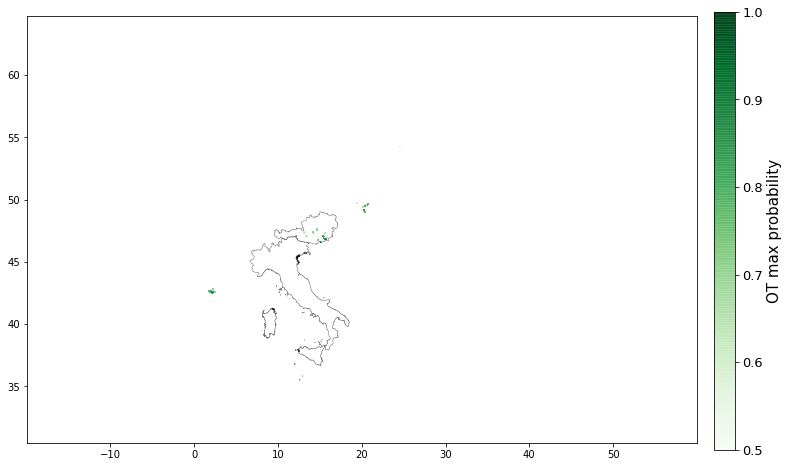

In [56]:
fig, ax = plt.subplots(figsize = (12,8))

#if (x_lim_S != None) & (y_lim_S != None):     
#    plt.xlim(x_lim_S)
#    plt.ylim(y_lim_S)

sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

cm=pl.pcolor(cpclon,cpclat,otpmax,cmap="Greens",vmin=0,vmax=100, zorder=2, alpha=0.9)

pl.clim([0.5,1])
cb_ot_ax = fig.add_axes([0.92, .12, .025, .76])
cb_ot = pl.colorbar(cax=cb_ot_ax)
cb_ot.ax.tick_params(axis='both', which='major', labelsize=13)
cb_ot.ax.set_ylabel('OT max probability', fontsize=15);

In [13]:
cpclon_FULL = cpclon 
cpclat_FULL = cpclat 
otpmax_FULL = otpmax 

In [14]:
otpmax_FULL.data[np.isnan(otpmax_FULL.data) == False]

array([0.69      , 0.69      , 0.69      , ..., 0.68000001, 0.66999996,
       0.66999996])

In [15]:
#number of OT detections over the dataset:
len(otpmax_FULL.data[np.isnan(otpmax_FULL.data) == False])

3217

**New Advancements** (continue reading OT data with NetCDF4 module but):

- Reduce the spatial domain before operating on the files: from lat=[30.02,64.98] & lon=[-9.98,29.98] limit the domain to SPHERA: lat=[35,49] & [6,19]

In this way instead of using matrices with 980x1120 (lons x lats) elements we consider matrices having **392x364** elements! **IMPLEMENTED**

In [14]:
lonmin_S=6; lonmax_S=19; latmin_S=35; latmax_S=49
latplot_S=[latmin_S,latmax_S]; lonplot_S=[lonmin_S,lonmax_S]
clonsel_S, clatsel_S, csizesel_S, cnamesel_S, ckindsel_S = HF.HF_cities(latmin_S,latmax_S,lonmin_S,lonmax_S)

In [15]:
cpclat, cpclon, otpmax, dtmin, ot_timing = HF.HF_OTdata(day,hhmin,hhmax,otpref,otsep,othstart)

In [16]:
ot_timing

['2016-08-29T13:00:00Z',
 '2016-08-29T13:15:00Z',
 '2016-08-29T13:30:00Z',
 '2016-08-29T13:45:00Z']

In [18]:
#SOME DATA EXPLORATION:
#To access non-masked data of masked array use:
otpmax.data

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [19]:
#extract only non-nans values from the matrix:
otpmax.data[np.isnan(otpmax.data) == False]

array([0.81      , 0.81      , 0.82999998, ..., 0.63999999, 0.63999999,
       0.63999999])

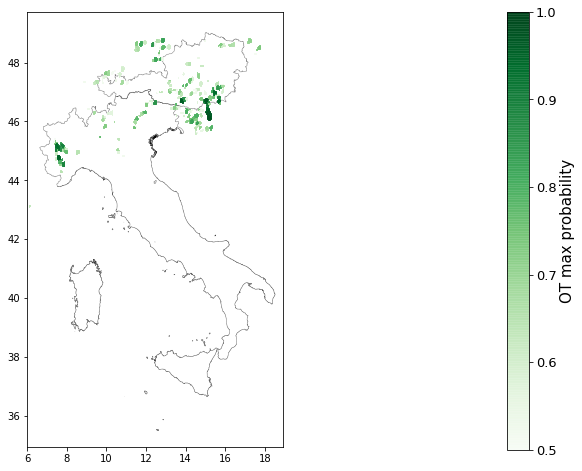

In [20]:
fig, ax = plt.subplots(figsize = (12,8))

#if (x_lim_S != None) & (y_lim_S != None):     
#    plt.xlim(x_lim_S)
#    plt.ylim(y_lim_S)

sf_geo[0].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)
if len(sf_geo) > 1:
    sf_geo[1].plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

cm=pl.pcolor(cpclon,cpclat,otpmax,cmap="Greens",vmin=0,vmax=100, zorder=2, alpha=0.9)

pl.clim([0.5,1])
cb_ot_ax = fig.add_axes([0.92, .12, .025, .76])
cb_ot = pl.colorbar(cax=cb_ot_ax)
cb_ot.ax.tick_params(axis='both', which='major', labelsize=13)
cb_ot.ax.set_ylabel('OT max probability', fontsize=15);

Count number of OT detections over the domain (<span style="color:red"> REMEMBER: some OTs are detected in the same place at different times!! so these are counted twice, thrice,... </span>)

In [23]:
len(otpmax.data[np.isnan(otpmax.data) == False])

1523

In [24]:
len(otpmax.data)

392

### Try new way of reading OT files:

- <span style="color:red"> Understand if it's worth to convert from numpy.MaskedArray format to Geopandas DataFrames, and plot with it (I think this should be useful when designing the filter for OT data) </span> 

READ SOME STUFF:
- https://stackoverflow.com/questions/46332479/store-netcdf-data-in-geodataframe
- https://arbolmarket.medium.com/working-with-geospatial-data-in-python-a5ad984c1161

SCHEMATIC IDEA ON HOW TO PROCEED:

<span style="color:blue"> **INPUT**: original OT netcdf files (every 15 mins but 4 files aggregated over 1 hour or over more hours)</span>  -> 

<span style="color:green"> **Process the data** (filter spatial domain, parallax correction, extract only useful variables (lat,lon,otmaxprob))</span> -> 

<span style="color:blue">**OUTPUT** 2-dimensional masked arrays (cpclat,cpclon,otpmax, dtmin?, ot_timing)</span> -> 

<span style="color:red"> Recombine the three arrays to form a unique netcdf file (or xarray??) and then convert to geopandas??</span> 

In [21]:
import xarray as xr

In [43]:
#read dataset with xarray
f_xr = xr.open_dataset(ncfile)  

In [44]:
f_xr

<xarray.Dataset>
Dimensions:                                         (time: 1, nlines: 980,
                                                     npixels: 1120)
Coordinates:
  * time                                            (time) datetime64[ns] 201...
    latitude                                        (nlines) float32 ...
    longitude                                       (npixels) float32 ...
Dimensions without coordinates: nlines, npixels
Data variables: (12/17)
    scan_time                                       (nlines) datetime64[ns] ...
    ir_brightness_temperature                       (time, nlines, npixels) float32 ...
    ot_probability                                  (time, nlines, npixels) float32 ...
    ot_id_number                                    (time, nlines, npixels) float32 ...
    hiwc_probability                                (time, nlines, npixels) float32 ...
    distance_to_overshooting_top                    (time, nlines, npixels) float32 ...
    ...                                              ...
    cloud_top_height                                (time, nlines, npixels) float32 ...
    tropopause_height                               (time, nlines, npixels) float32 ...
    tropopause_pressure                             (time, nlines, npixels) float32 ...
    cloud_top_pressure                              (time, nlines, npixels) float32 ...
    cloud_top_potential_temperature                 (time, nlines, npixels) float32 ...
    ir_anvil_detection                              (time, nlines, npixels) float32 ...
Attributes: (12/23)
    title:                        Geostationary Visible and Infrared Imager D...
    summary:                      This file contains products designed to ide...
    reference1:                   Khlopenkov, K. V., K. M. Bedka, J. W. Coone...
    reference2:                   Cooney, J. W., Bedka, K. M., Bowman, K. P.,...
    reference3:                   Yost, C. R., Bedka, K. M., Minnis, P., Nguy...
    creator_name:                 Kristopher Bedka and Konstantin Khlopenkov
    ...                           ...
    geospatial_lat_max:            64.98
    geospatial_lon_min:            -9.98
    geospatial_lon_max:            29.98
    time_coverage_start:          2016-08-29T23:59:37Z
    time_coverage_end:            2016-08-29T23:57:20Z
    numerical_model_data_source:  MERRA-2

In [47]:
#convert xarray dataset to pandas dataframe
df_f_xr = f_xr.to_dataframe()

In [48]:
df_f_xr

latitude  longitude  \
time                nlines npixels                         
2016-08-29 23:45:00 0      0        64.982140  -9.982143   
                           1        64.982140  -9.946429   
                           2        64.982140  -9.910715   
                           3        64.982140  -9.875000   
                           4        64.982140  -9.839286   
...                                       ...        ...   
                    979    1115     30.017859  29.839287   
                           1116     30.017859  29.874998   
                           1117     30.017859  29.910713   
                           1118     30.017859  29.946428   
                           1119     30.017859  29.982143   

                                                       scan_time  \
time                nlines npixels                                 
2016-08-29 23:45:00 0      0       2016-08-29 23:59:36.650956800   
                           1       2016-08-29 23:59:36.650956800   
                           2       2016-08-29 23:59:36.650956800   
                           3       2016-08-29 23:59:36.650956800   
                           4       2016-08-29 23:59:36.650956800   
...                                                          ...   
                    979    1115    2016-08-29 23:57:19.866529792   
                           1116    2016-08-29 23:57:19.866529792   
                           1117    2016-08-29 23:57:19.866529792   
                           1118    2016-08-29 23:57:19.866529792   
                           1119    2016-08-29 23:57:19.866529792   

                                    ir_brightness_temperature  ot_probability  \
time                nlines npixels                                              
2016-08-29 23:45:00 0      0                       272.079987             NaN   
                           1                       272.320007             NaN   
                           2                       272.440002             NaN   
                           3                       272.369995             NaN   
                           4                       272.290009             NaN   
...                                                       ...             ...   
                    979    1115                           NaN             NaN   
                           1116                           NaN             NaN   
                           1117                           NaN             NaN   
                           1118                           NaN             NaN   
                           1119                           NaN             NaN   

                                    ot_id_number  hiwc_probability  \
time                nlines npixels                                   
2016-08-29 23:45:00 0      0                 NaN              0.11   
                           1                 NaN              0.11   
                           2                 NaN              0.11   
                           3                 NaN              0.11   
                           4                 NaN              0.11   
...                                          ...               ...   
                    979    1115              NaN               NaN   
                           1116              NaN               NaN   
                           1117              NaN               NaN   
                           1118              NaN               NaN   
                           1119              NaN               NaN   

                                    distance_to_overshooting_top  \
time                nlines npixels                                 
2016-08-29 23:45:00 0      0                                 NaN   
                           1                                 NaN   
                           2                                 NaN   
                           3                                 NaN  

**Try to do**: combine separate post-processed masked arrays cpclon,cpclat,otpmax,ot_timing to form a unique xarray dataset (and then maybe to convert it to a geopandas dataframe) https://docs.xarray.dev/en/stable/user-guide/combining.html

<span style="color:blue">**WATCH OUT**</span>: also ot_timing must be included to get info on timing! FOr the moment, considering only hourly aggregations, the four OT files avery 15mins are linked to the first hour of the aggregation (e.g. 13,13.15,13.30,13,45 -> 13) so only ot_timing[0] is considered, <span style="color:red">evaluate later how to proceed for multi-hours aggregations (if considered but i think not since SPHERA data are also hourly it makes sense to consider 1-h frequency!)</span>

In [19]:
#multi-dim array containing the three arrays
data = otpmax
coords = [ot_timing[0], cpclat, cpclon]

In [18]:
data

['2016-08-29T13:00:00Z',
 masked_array(
   data=[[48.848145, 48.848145, 48.848145, ..., 48.829144, 48.829144,
          48.829144],
         [48.812428, 48.812428, 48.812428, ..., 48.793427, 48.792427,
          48.792427],
         [48.77672 , 48.77672 , 48.77672 , ..., 48.756718, 48.756718,
          48.757717],
         ...,
         [35.011284, 35.011284, 35.011284, ..., 35.011284, 35.011284,
          35.011284],
         [34.976574, 34.976574, 34.976574, ..., 34.975574, 34.975574,
          34.975574],
         [34.940857, 34.940857, 34.940857, ..., 34.939857, 34.939857,
          34.939857]],
   mask=False,
   fill_value=1e+20,
   dtype=float32),
 masked_array(
   data=[[ 5.9898577,  6.025572 ,  6.061286 , ..., 18.805716 , 18.84143  ,
          18.876143 ],
         [ 5.9898577,  6.025572 ,  6.061286 , ..., 18.805716 , 18.84043  ,
          18.876143 ],
         [ 5.9898577,  6.025572 ,  6.061286 , ..., 18.804714 , 18.84043  ,
          18.876143 ],
         ...,
         [ 6.00

In [22]:
foo = xr.DataArray(data, coords=coords, dims=["time", "latitude", "longitude"])

ValueError: coords is not dict-like, but it has 3 items, which does not match the 2 dimensions of the data